# 2. Análisis Exploratorio de Datos (EDA)

## Setup

In [25]:
import sys, os
sys.path.append(os.getcwd().replace('/notebooks',''))  # Replace with current directory name

In [26]:
#===== Configuración regional =================================
import locale

# Name might vary with operating system.
locale.setlocale(locale.LC_ALL, 'es_ES')

locale._override_localeconv["thousands_sep"] = "."

#===== Librerías ==============================================
# Importing the Warnings library for better presentation
import warnings

# Importando la biblioteca pandas para manipulación y análisis de datos
import pandas as pd
# Importando NumPy para operaciones numéricas y manipulación de arreglos
import numpy as np
# Importando itertools para generar combinaciones de columnas
import itertools

# Importando matplotlib.pyplot para crear gráficos y visualizaciones
import matplotlib.pyplot as plt
# Importando Seaborn para visualización de datos estadísticos (opcional, pero puede complementar a Plotly)
import seaborn as sns
# Importando Plotly Express para visualizaciones interactivas de alto nivel y fáciles de usar
import plotly.express as px
# Importando Plotly Graph Objects para un control más detallado sobre las visualizaciones
import plotly.graph_objects as go
# Multiple graphs in a figure
from plotly.subplots import make_subplots

# Importando la función seasonal_decompose para la descomposición de series temporales
from statsmodels.tsa.seasonal import seasonal_decompose

#===== Ajustes visualización gráficos ============================
warnings.filterwarnings('ignore', category=DeprecationWarning)
# Matplotlib inline to visualize Matplotlib graphs
%matplotlib inline

# Configuration to set so that all the Seaborn figures come out with this size
%config Inlinebackend.figure_format= 'retina'
warnings.resetwarnings()

# Set the Seaborn context to "poster" for larger text and figures
sns.set_context("poster")

# Set the default figure size for Seaborn plots
sns.set(rc={"figure.figsize": (12., 6.)})

# Set the Seaborn style to "whitegrid" for a white background with gridlines
sns.set_style("whitegrid")

#===== Librerías proyecto ============================
from utils.data import Datasets
from utils.eda import column_explore


## Carga Inicial de Datos

In [27]:
ds = Datasets()
cash_orig, fees_orig = ds.get_original_datasets()

## Dimensión y Tipos de Datos

In [28]:
cash_orig.shape # 23970 peticiones de cash

(23970, 16)

In [29]:
fees_orig.shape # 21061 fees

(21061, 13)

In [30]:
# Column names
print(f"Column Names: {cash_orig.columns}\n")
print(f"Column Names: {fees_orig.columns}")

Column Names: Index(['id', 'amount', 'status', 'created_at', 'updated_at', 'user_id',
       'moderated_at', 'deleted_account_id', 'reimbursement_date',
       'cash_request_received_date', 'money_back_date', 'transfer_type',
       'send_at', 'recovery_status', 'reco_creation', 'reco_last_update'],
      dtype='object')

Column Names: Index(['id', 'cash_request_id', 'type', 'status', 'category', 'total_amount',
       'reason', 'created_at', 'updated_at', 'paid_at', 'from_date', 'to_date',
       'charge_moment'],
      dtype='object')


In [31]:
cash_orig.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23970 entries, 0 to 23969
Data columns (total 16 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   id                          23970 non-null  int64  
 1   amount                      23970 non-null  float64
 2   status                      23970 non-null  object 
 3   created_at                  23970 non-null  object 
 4   updated_at                  23970 non-null  object 
 5   user_id                     21867 non-null  float64
 6   moderated_at                16035 non-null  object 
 7   deleted_account_id          2104 non-null   float64
 8   reimbursement_date          23970 non-null  object 
 9   cash_request_received_date  16289 non-null  object 
 10  money_back_date             16543 non-null  object 
 11  transfer_type               23970 non-null  object 
 12  send_at                     16641 non-null  object 
 13  recovery_status             333

In [32]:
fees_orig.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21061 entries, 0 to 21060
Data columns (total 13 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   id               21061 non-null  int64  
 1   cash_request_id  21057 non-null  float64
 2   type             21061 non-null  object 
 3   status           21061 non-null  object 
 4   category         2196 non-null   object 
 5   total_amount     21061 non-null  float64
 6   reason           21061 non-null  object 
 7   created_at       21061 non-null  object 
 8   updated_at       21061 non-null  object 
 9   paid_at          15531 non-null  object 
 10  from_date        7766 non-null   object 
 11  to_date          7766 non-null   object 
 12  charge_moment    21061 non-null  object 
dtypes: float64(2), int64(1), object(10)
memory usage: 2.1+ MB


## Revisión de Columnas con Valores Clave

In [33]:
columnas_cash_request=cash_orig.columns.tolist()
for i in columnas_cash_request:
    print("===========================")
    print(f"{cash_orig[i].value_counts().head(10)}")

id
5        1
15322    1
19569    1
15338    1
15329    1
15341    1
15336    1
15334    1
15165    1
15346    1
Name: count, dtype: int64
amount
100.0    16094
50.0      5304
25.0      1276
80.0       267
60.0       190
70.0       151
20.0       132
30.0       114
40.0       100
90.0        91
Name: count, dtype: int64
status
money_back               16397
rejected                  6568
direct_debit_rejected      831
active                      59
transaction_declined        48
direct_debit_sent           34
canceled                    33
Name: count, dtype: int64
created_at
2019-12-10 19:05:21.596873+00    1
2020-09-09 11:06:31.382449+00    1
2020-10-07 05:56:54.442506+00    1
2020-09-09 12:32:29.661278+00    1
2020-09-09 11:42:31.956338+00    1
2020-09-09 12:43:05.909299+00    1
2020-09-09 12:23:09.95394+00     1
2020-09-09 12:16:17.993242+00    1
2020-09-08 16:01:25.146577+00    1
2020-09-09 12:57:42.599222+00    1
Name: count, dtype: int64
updated_at
2019-12-11 16:47:42.40783+00  

In [34]:
columnas_fees=fees_orig.columns.tolist()
for i in columnas_fees:
    print("===========================")
    print(f"{fees_orig[i].value_counts().head(10)}")

id
6537    1
7852    1
7846    1
7844    1
6968    1
7819    1
7816    1
7815    1
9183    1
7814    1
Name: count, dtype: int64
cash_request_id
12225.0    35
5006.0     28
4410.0     24
12452.0    23
11376.0    21
2358.0     19
11746.0    17
15319.0    16
4956.0     15
8713.0     15
Name: count, dtype: int64
type
instant_payment    11099
postpone            7766
incident            2196
Name: count, dtype: int64
status
accepted     14841
cancelled     4938
rejected      1194
confirmed       88
Name: count, dtype: int64
category
rejected_direct_debit     1599
month_delay_on_payment     597
Name: count, dtype: int64
total_amount
5.0     21060
10.0        1
Name: count, dtype: int64
reason
rejected direct debit               1599
month delay on payment - 9/2020      283
month delay on payment - 8/2020      203
month delay on payment - 10/2020     102
Postpone Cash Request 12225           34
Postpone Cash Request 5006            25
Postpone Cash Request 4410            23
Postpone Cash Re

## Visualización de Distribuciones de Datos Categóricos

In [35]:
not_numericals = cash_orig.select_dtypes(np.object_).columns
not_numericals
lst_pies = []
for c in not_numericals:
    counts = cash_orig[c].value_counts()
    counts.name = c        
    if len(counts)<=10:
        drawpie = '-> pie'
        lst_pies.append(counts)
    else:
        drawpie = ''
    print(f'{c} ({counts.index.__len__()} unique values)', drawpie)
print(f'\nDibujaremos {len(lst_pies)} pie charts...')

status (7 unique values) -> pie


created_at (23970 unique values) 
updated_at (23970 unique values) 
moderated_at (16035 unique values) 
reimbursement_date (4089 unique values) 
cash_request_received_date (312 unique values) 
money_back_date (12221 unique values) 
transfer_type (2 unique values) -> pie
send_at (16641 unique values) 
recovery_status (4 unique values) -> pie
reco_creation (3330 unique values) 
reco_last_update (3330 unique values) 

Dibujaremos 3 pie charts...


In [36]:
# We want a subplot for every pie chart
# We want a subplot for every column
total_subplots = len(lst_pies)
cols = 3
rows = (total_subplots // cols) if (total_subplots % cols == 0) else (total_subplots // cols) + 1

# The name of the list will be the subplot title
subplot_titles = [lst_item.name for lst_item in lst_pies]

# Setup subplots
specs = [[{'type':'domain'}] * cols] * rows
fig = make_subplots(
        rows=rows,
        cols=cols,
        subplot_titles=subplot_titles,
        specs=specs,
        print_grid=False)

for i, lst_item in enumerate(lst_pies):
    # basic math to get col and row
    row = i // cols + 1
    col = i % (cols) + 1
    fig.add_trace(
        go.Pie(labels=lst_item.index,
               values=lst_item.values,               
               showlegend=False,
               textposition='inside',
               textinfo='label+percent'),               
         row=row,
         col=col         
    )

fig.update_layout(title="Categorical variables in cash_request", title_x=0.5, autosize=True, height=500, width=1024)
fig.show()

In [37]:
not_numericals = fees_orig.select_dtypes(np.object_).columns
not_numericals
lst_pies = []
for c in not_numericals:
    counts = fees_orig[c].value_counts()
    counts.name = c        
    if len(counts)<=10:
        drawpie = '-> pie'
        lst_pies.append(counts)
    else:
        drawpie = ''
    print(f'{c} ({counts.index.__len__()} unique values)', drawpie)
print(f'\nDibujaremos {len(lst_pies)} pie charts...')

type (3 unique values) -> pie
status (4 unique values) -> pie
category (2 unique values) -> pie
reason (15149 unique values) 
created_at (21026 unique values) 
updated_at (21061 unique values) 
paid_at (15529 unique values) 
from_date (1084 unique values) 
to_date (1560 unique values) 
charge_moment (2 unique values) -> pie

Dibujaremos 4 pie charts...


In [38]:
# We want a subplot for every pie chart
total_subplots = len(lst_pies)
cols = 2
rows = (total_subplots // cols) if (total_subplots % cols == 0) else (total_subplots // cols) + 1

# The name of the list will be the subplot title
subplot_titles = [lst_item.name for lst_item in lst_pies]

# Setup subplots
specs = [[{'type':'domain'}] * cols] * rows
fig = make_subplots(
        rows=rows,
        cols=cols,
        subplot_titles=subplot_titles,
        specs=specs,
        print_grid=False)

for i, lst_item in enumerate(lst_pies):
    # basic math to get col and row
    row = i // cols + 1
    col = i % (cols) + 1
    fig.add_trace(
        go.Pie(labels=lst_item.index,
               values=lst_item.values,               
               showlegend=False,
               textposition='inside',
               textinfo='label+percent'),               
         row=row,
         col=col
    )
    
fig.update_layout(title="Categorical variables in fees", title_x=0.5, autosize=True, height=800, width=1024)
fig.show()

## Visualización de Distribuciones de Datos Numéricos

In [39]:
cash_orig.describe()

,id,amount,user_id,deleted_account_id
count,23970.000000,23970.000000,21867.000000,2104.000000
mean,13910.966124,82.720818,32581.250789,9658.755228
std,7788.117214,26.528065,27618.565773,7972.743249
min,3.000000,1.000000,34.000000,91.000000
25%,7427.250000,50.000000,10804.000000,3767.000000
50%,14270.500000,100.000000,23773.000000,6121.500000
75%,20607.750000,100.000000,46965.000000,16345.000000
max,27010.000000,200.000000,103719.000000,30445.000000


In [83]:
columnas_numericas = cash_orig.describe().columns.tolist()
df = cash_orig

# We want a subplot for every column
total_subplots = len(columnas_numericas)
cols = 1
rows = (total_subplots // cols) if (total_subplots % cols == 0) else (total_subplots // cols) + 1

# The name of the list will be the subplot title
subplot_titles = [c for c in columnas_numericas]

# Setup subplots
specs = [[{'type':'histogram'}] * cols] * rows
fig = make_subplots(
        rows=rows,
        cols=cols,
        # subplot_titles=subplot_titles,
        specs=specs,
        print_grid=False)

for i, c in enumerate(columnas_numericas):
    # basic math to get col and row
    row = i // cols + 1
    col = i % (cols) + 1    
    color=px.colors.qualitative.Plotly[1] if (c=='amount') else px.colors.qualitative.Plotly[0]    
    fig.add_trace(go.Histogram(x=df[c], name='', showlegend=False, marker=dict(color=color)),
                  row = row, col = col)    

yaxis_names = sorted(['yaxis'] + [axis_name for axis_name in fig.layout._subplotid_props if 'yaxis' in axis_name])[:rows]
yaxis_layout_dict = {yaxis_name:dict(title=columnas_numericas[i]) for i, yaxis_name in enumerate(yaxis_names)}
fig.update_layout(yaxis_layout_dict)

fig.update_layout(title="Numerical variables in cash_request", title_x=0.5, autosize=True, height=800)

fig.show()

In [17]:
fees_orig.describe()

,id,cash_request_id,total_amount
count,21061.000000,21057.000000,21061.000000
mean,10645.355111,16318.449162,5.000237
std,6099.315256,6656.149949,0.034453
min,1.000000,1456.000000,5.000000
25%,5385.000000,11745.000000,5.000000
50%,10652.000000,17160.000000,5.000000
75%,15925.000000,21796.000000,5.000000
max,21193.000000,27010.000000,10.000000


In [96]:
columnas_numericas = fees_orig.describe().columns.tolist()
df = fees_orig

# We want a subplot for every column
total_subplots = len(columnas_numericas)
cols = 1
rows = (total_subplots // cols) if (total_subplots % cols == 0) else (total_subplots // cols) + 1

# The name of the list will be the subplot title
subplot_titles = [c for c in columnas_numericas]

# Setup subplots
specs = [[{'type':'histogram'}] * cols] * rows
fig = make_subplots(
        rows=rows,
        cols=cols,
        # subplot_titles=subplot_titles,
        specs=specs,
        print_grid=False)

for i, c in enumerate(columnas_numericas):
    # basic math to get col and row
    row = i // cols + 1
    col = i % (cols) + 1    
    color = px.colors.qualitative.Plotly[0]
    autobinx = True
    sizebins = None
    if (c=='total_amount'):
        color = px.colors.qualitative.Plotly[1] 
        autobinx = False
        sizebins = 1
    fig.add_trace(go.Histogram(x=df[c], name='', showlegend=False, marker=dict(color=color), autobinx=autobinx, xbins=dict(size=sizebins)),
                  row = row, col = col)    

yaxis_names = sorted(['yaxis'] + [axis_name for axis_name in fig.layout._subplotid_props if 'yaxis' in axis_name])[:rows]
yaxis_layout_dict = {yaxis_name:dict(title=columnas_numericas[i]) for i, yaxis_name in enumerate(yaxis_names)}
fig.update_layout(yaxis_layout_dict)

fig.update_layout(title="Numerical variables in fees", title_x=0.5, autosize=True, height=800)

fig.show()

## Identificación de Valores Atípicos

In [104]:
columnas_numericas = cash_orig.describe().columns.tolist()
df = cash_orig

# We want a subplot for every column
total_subplots = len(columnas_numericas)
cols = 4
rows = (total_subplots // cols) if (total_subplots % cols == 0) else (total_subplots // cols) + 1

# The name of the list will be the subplot title
subplot_titles = [c for c in columnas_numericas]

# Setup subplots
specs = [[{'type':'box'}] * cols] * rows
fig = make_subplots(
        rows=rows,
        cols=cols,
        # subplot_titles=subplot_titles,
        specs=specs,
        print_grid=False)

for i, c in enumerate(columnas_numericas):
    # basic math to get col and row
    row = i // cols + 1
    col = i % (cols) + 1
    color=px.colors.qualitative.Plotly[1] if (c=='amount') else px.colors.qualitative.Plotly[0]
    fig.add_trace(go.Box(y=df[c], name='', showlegend=False, marker=dict(color=color)),
                  row = row, col = col)

yaxis_names = sorted(['yaxis'] + [axis_name for axis_name in fig.layout._subplotid_props if 'yaxis' in axis_name])[:cols]
yaxis_layout_dict = {yaxis_name:dict(title=columnas_numericas[i]) for i, yaxis_name in enumerate(yaxis_names)}
fig.update_layout(yaxis_layout_dict)

fig.update_layout(title="Numerical variables in cash_request", title_x=0.5, autosize=True, height=600)

fig.show()

In [105]:
columnas_numericas = fees_orig.describe().columns.tolist()
df = fees_orig

# We want a subplot for every column
total_subplots = len(columnas_numericas)
cols = 3
rows = (total_subplots // cols) if (total_subplots % cols == 0) else (total_subplots // cols) + 1

# The name of the list will be the subplot title
subplot_titles = [c for c in columnas_numericas]

# Setup subplots
specs = [[{'type':'box'}] * cols] * rows
fig = make_subplots(
        rows=rows,
        cols=cols,
        # subplot_titles=subplot_titles,
        specs=specs,
        print_grid=False)

for i, c in enumerate(columnas_numericas):
    # basic math to get col and row
    row = i // cols + 1
    col = i % (cols) + 1
    color=px.colors.qualitative.Plotly[1] if (c=='total_amount') else px.colors.qualitative.Plotly[0]
    fig.add_trace(go.Box(y=df[c], name='', showlegend=False, marker=dict(color=color)),
                  row = row, col = col)

yaxis_names = sorted(['yaxis'] + [axis_name for axis_name in fig.layout._subplotid_props if 'yaxis' in axis_name])[:cols]
yaxis_layout_dict = {yaxis_name:dict(title=columnas_numericas[i]) for i, yaxis_name in enumerate(yaxis_names)}
fig.update_layout(yaxis_layout_dict)

fig.update_layout(title="Numerical variables in fees", title_x=0.5, autosize=True, height=600)

fig.show()

# Distribución de Valores Numéricos

In [127]:
columnas_numericas = cash_orig.describe().columns.tolist()
df = cash_orig

# We want a subplot for every column
total_subplots = len(columnas_numericas)
cols = 4
rows = (total_subplots // cols) if (total_subplots % cols == 0) else (total_subplots // cols) + 1

# The name of the list will be the subplot title
subplot_titles = [c for c in columnas_numericas]

# Setup subplots
specs = [[{'type':'violin'}] * cols] * rows
fig = make_subplots(
        rows=rows,
        cols=cols,
        # subplot_titles=subplot_titles,
        specs=specs,
        print_grid=False)

data = []
for i, c in enumerate(columnas_numericas):
    # basic math to get col and row
    row = i // cols + 1
    col = i % (cols) + 1
    color=px.colors.qualitative.Plotly[1] if (c=='amount') else px.colors.qualitative.Plotly[0]
    data.append(go.Violin(y=df[c], showlegend=False, marker=dict(color=color)))

fig.add_traces(data, rows=[1, 1, 1, 1], cols=[1, 2, 3, 4])

yaxis_names = sorted(['yaxis'] + [axis_name for axis_name in fig.layout._subplotid_props if 'yaxis' in axis_name])[:cols]
yaxis_layout_dict = {yaxis_name:dict(title=columnas_numericas[i]) for i, yaxis_name in enumerate(yaxis_names)}
fig.update_layout(yaxis_layout_dict)

fig.update_xaxes(showticklabels=False)

fig.update_layout(title="Numerical variables in cash_request", title_x=0.5, autosize=True, height=600)

fig.show()   

In [128]:
columnas_numericas = fees_orig.describe().columns.tolist()
df = fees_orig

# We want a subplot for every column
total_subplots = len(columnas_numericas)
cols = 3
rows = (total_subplots // cols) if (total_subplots % cols == 0) else (total_subplots // cols) + 1

# The name of the list will be the subplot title
subplot_titles = [c for c in columnas_numericas]

# Setup subplots
specs = [[{'type':'violin'}] * cols] * rows
fig = make_subplots(
        rows=rows,
        cols=cols,
        # subplot_titles=subplot_titles,
        specs=specs,
        print_grid=False)

data = []
for i, c in enumerate(columnas_numericas):
    # basic math to get col and row
    row = i // cols + 1
    col = i % (cols) + 1
    color=px.colors.qualitative.Plotly[1] if (c=='total_amount') else px.colors.qualitative.Plotly[0]
    data.append(go.Violin(y=df[c], showlegend=False, marker=dict(color=color)))

fig.add_traces(data, rows=[1, 1, 1], cols=[1, 2, 3])

yaxis_names = sorted(['yaxis'] + [axis_name for axis_name in fig.layout._subplotid_props if 'yaxis' in axis_name])[:cols]
yaxis_layout_dict = {yaxis_name:dict(title=columnas_numericas[i]) for i, yaxis_name in enumerate(yaxis_names)}
fig.update_layout(yaxis_layout_dict)

fig.update_xaxes(showticklabels=False)

fig.update_layout(title="Numerical variables in cash_request", title_x=0.5, autosize=True, height=600)

fig.show()   

## Gráficos de Dispersión

In [164]:
# Ref. https://python-graph-gallery.com/111-custom-correlogram/
# sns.pairplot(cash_orig)
dimensions = []
for c in cash_orig.describe().columns.tolist():
    dimensions.append(dict(label=c,
                              values=cash_orig[c]))
    

fig = go.Figure(data=go.Splom(
               dimensions=dimensions,
               showupperhalf=False,
               diagonal_visible=False,
               opacity=0.4
               ))


fig.update_layout(
    width=1024,
    height=800,
    title='Gráficos de dispersión para cash_request'
)

fig.show()

In [165]:
# sns.pairplot(fees_orig)
dimensions = []
for c in fees_orig.describe().columns.tolist():
    dimensions.append(dict(label=c,
                              values=fees_orig[c]))
    

fig = go.Figure(data=go.Splom(
               dimensions=dimensions,
               showupperhalf=False,
               diagonal_visible=False,
               opacity=0.4
               ))


fig.update_layout(
    width=1024,
    height=800,
    title='Gráficos de dispersión para fees'
)

fig.show()

## Matrices de correlación

Text(0.5, 1.0, 'Correlation matrix for cash_request')

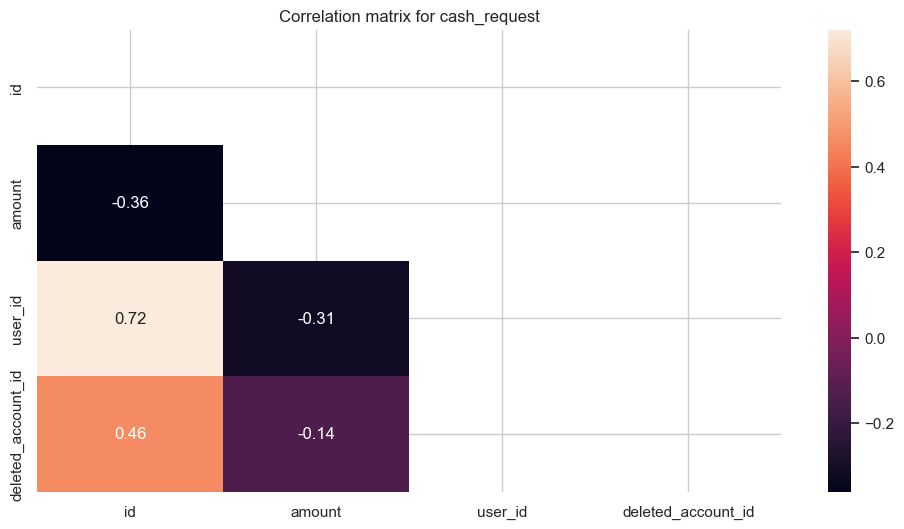

In [160]:
numericals = cash_orig.select_dtypes(np.number)
corr = numericals.corr()
# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))
plt = sns.heatmap(corr.round(2), mask=mask, annot=True)
plt.set_title('Correlation matrix for cash_request')

Text(0.5, 1.0, 'Correlation matrix for fees')

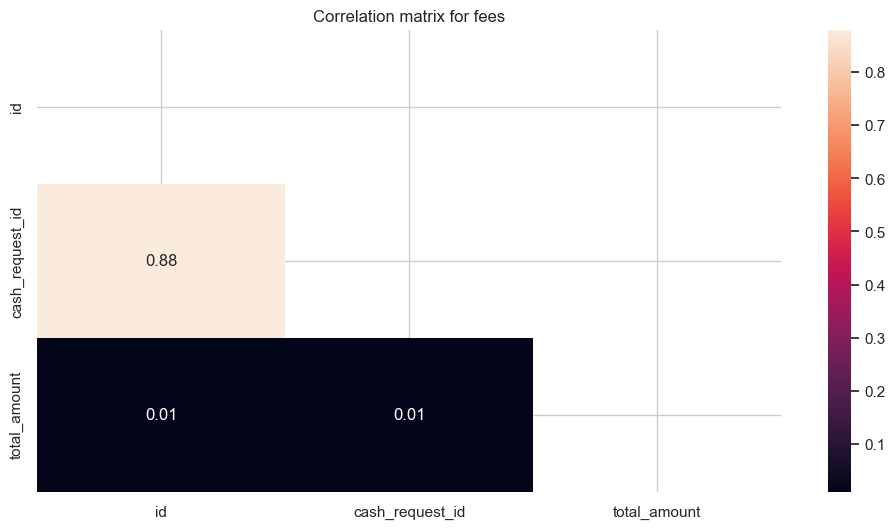

In [162]:
numericals = fees_orig.select_dtypes(np.number)
corr = numericals.corr()
# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))
plt = sns.heatmap(corr.round(2), mask=mask, annot=True)
plt.set_title('Correlation matrix for fees')